In [ ]:
import pytesseract
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display
from PIL import Image
import cv2 as cv
import random
import os
import re
import requests
import plotly.express as px
from pdf2image import convert_from_path, convert_from_bytes

In [ ]:
base_path = "C:/Users/vs224/Documents/PortugalTowns/"
book_path = base_path + "Portugal_Memoria_para_servir_de_indice_dos_foraes-1825.pdf"
path = base_path + "images/"

START = 18 # start page for the index
END = 72 # end page for the index

# Run first time to convert PDF pages to Image objects

In [ ]:
# image_raw = convert_from_path(book_path, output_folder=path)

# Saving our converted pages to JPG files (only need to run this once)

In [ ]:
# for i, img in enumerate(image_raw):
#     img.save("C:/Users/vs224/Documents/PortugalTowns/images/page_{}.jpg".format(i))

In [ ]:
# Creating an array to store all of our file paths
NUM_PAGES = 328
image_paths = [path + "page_{}.jpg".format(i) for i in range(NUM_PAGES)]

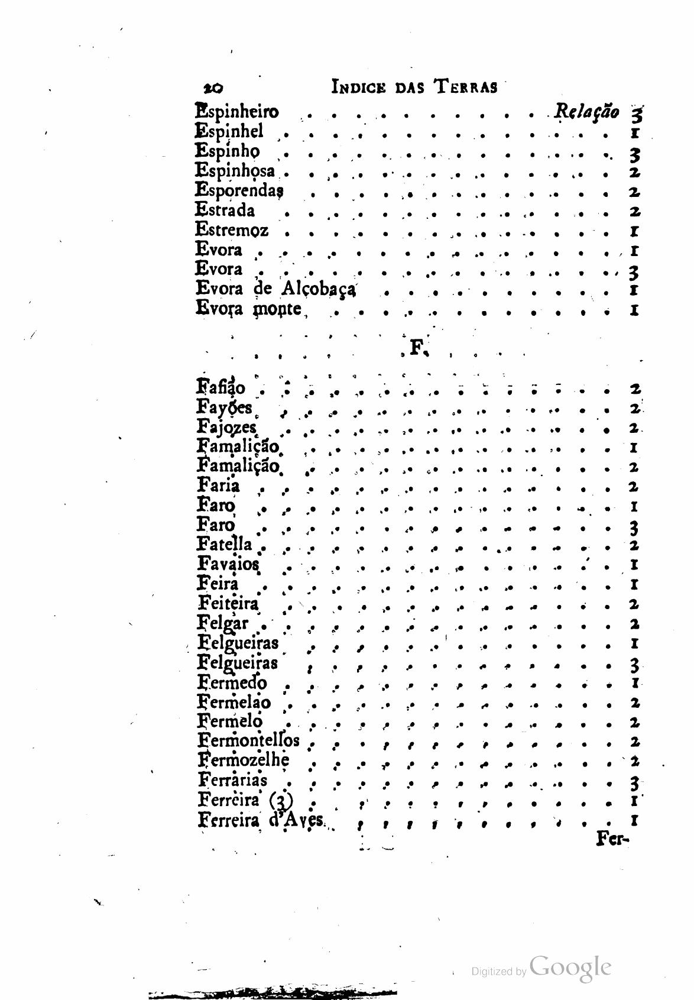

In [ ]:
test_page = Image.open(image_paths[37])
display(test_page)

# Running Tesseract on base image to get a benchmark

In [ ]:
print(pytesseract.image_to_string(test_page, lang="por"))

20

Espinheiro ..
Espinhel . .
Espinho ...
Espinhosa . .
Esporendas .
Estrada ..
Estremoz . .
Evora . .
Evora . ..

InDickE DAS TERRAS

Evora de Alcobaça

Fafião FR
Fayões, , «
Fajozes

dmulião, am

amalição,
Fara . ..

“o

Faro

Felgueiras

Fermedo é

Fermontellos .
Fermozelhe
Ferrárias + o
Ferreira (E9)

Ferreira dA

vês.

Evora monte, . .

»

e
.
D

to»

-

“vv vtd

da MORADA O ID O IM

Da DOS RD DD DO O aU OD DD DA AI MO a DD IM DD O

=



## Using denoiser to compare results of OCR on image w/ noise and w/out

In [ ]:
test_page = cv.imread(image_paths[37], cv.IMREAD_GRAYSCALE)
dst = cv.fastNlMeansDenoising(test_page, None, 60, 7, 21)
dst = cv.ximgproc.niBlackThreshold(dst, None, 2, 3, 0.1)

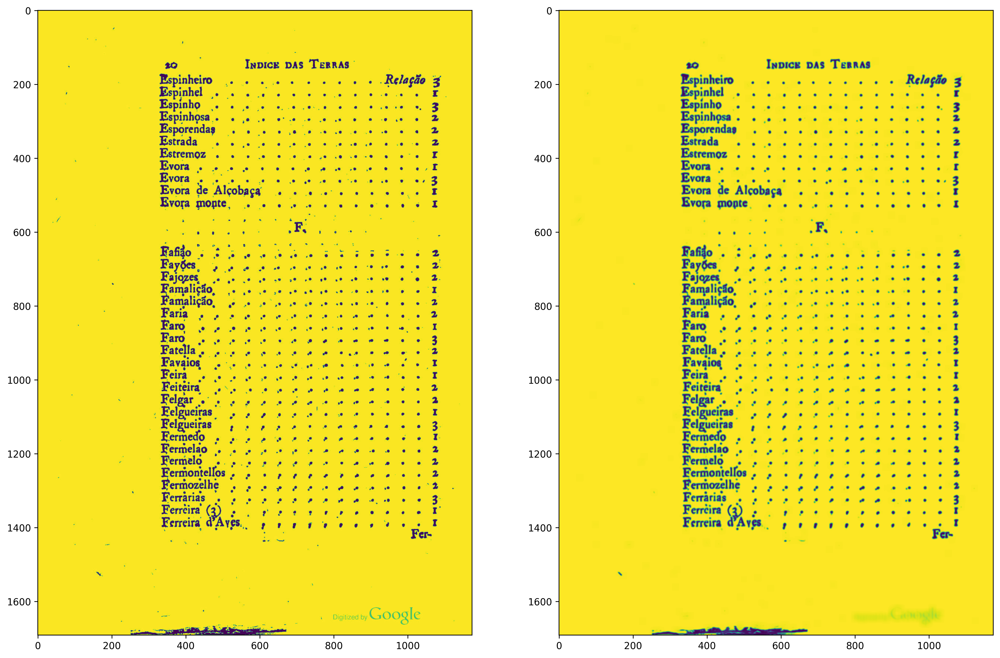

In [ ]:
plt.figure(figsize=(18, 12), dpi=300)
plt.subplot(121),plt.imshow(test_page)
plt.subplot(122),plt.imshow(dst)
plt.show()

## Running Tesseract on new, denoised image

In [ ]:
print(pytesseract.image_to_string(dst, lang="por"))

20
Espinheiro

Espinhel . 0.
Espinho ....
Espinhosa . +...
Esporendas ...
Estrada ... .
Estremoz . . .
Evora . :
Evora . ....
Evora de Alcobaça
Evora monte ,
Fafão . 2...
Fayões, , +.
Fajges
Famalição, ..
Famalição, + ..
Faria .
Faro «os
Faro ..
Fatella , 5”
Favaios .. ..
eira ..
patio 8, qo qo
elgar . cc vs
Relgueiias 2.2.
Felgueiras , ..,
Fermedo . +...
Fermelão .. .
Fermelo ... .
Fermontellos , , .
Fermozelhe . .
Ferrárias +...
Ferrcira (3) º
Ferreira d'Aves

Inpice DAS TERRAS

tt... .

e...

“rs

..1 +.

cetro. +

ie”

... e.

... nu.

...... ..

.....

g"

“.........

.........

Om rs A O O ID

DELA) RD | À | ma) 4 DD |O Da td MDA a ÃO O Da | | |



# Iterating through all pages of the initial index and writing our OCR'd text to text files

In [ ]:
START = 18 # start page for the index
END = 72 # end page for the index

os.chdir(base_path + "indice/")

for i in range(START, END+1):
    page = cv.imread(image_paths[i], cv.IMREAD_GRAYSCALE)
    dst = cv.fastNlMeansDenoising(page, None, 60, 7, 21)
    dst = cv.ximgproc.niBlackThreshold(dst, None, 2, 3, 0.1)
    text = pytesseract.image_to_string(dst, lang="por")
    with open(f'indice_{i + 1 - START}.txt', 'w', encoding = 'utf-8') as f:
        f.write(text)

print("File writing done!")

File writing done!


# Working with regex to clean up our OCR'd text and remove excess characters/noise



In [ ]:
for i in range(START, END+1):
    with open(f'indice_{i + 1 - START}.txt', 'r', encoding = 'utf-8') as f:
        lines = f.readlines()
        with open(f'clean_indice_{i + 1 - START}.txt', 'w', encoding = 'utf-8') as f1:
            for line in lines:
                if (line != '\n'):
                    # get rid of excess periods, commas and other symbols that appear in the text
                    line = line[:line.find('.')]
                    line = re.sub(r'[,\+\-=:\*]', ' ', line)
                    # remove any leading/trailing whitespace
                    line = line.lstrip()
                    line = line.rstrip()
                    f1.write(line)
                    f1.write("\n")
print("Files cleaned!")

Files cleaned!


# Let's take a look at how effective the cleaning was. We'll pick a random page and compare the original image to the text from our new cleaned files.

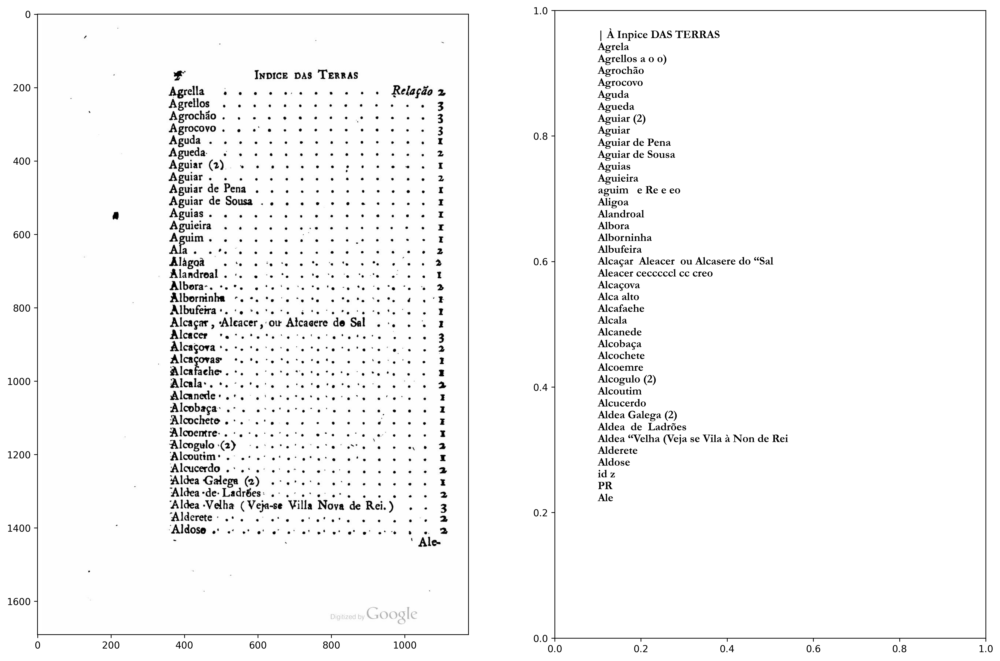

In [ ]:
# finding a random page
random_idx = random.randint(START, END)

text = ""

os.chdir(base_path + "indice/")

# grabbing the text we generated through running OCR on the page
with open(f'clean_indice_{random_idx - START + 1}.txt', 'r', encoding = 'utf-8') as f:
        lines = f.readlines()
        for line in lines:
            if (line != "\n"):
                text += line

# displaying the original image and the text from OCR side-by-side
random_pg = cv.imread(image_paths[random_idx])
plt.figure(figsize=(18, 12), dpi=300)
plt.subplot(121),plt.imshow(random_pg)
plt.subplot(122),plt.text(0.1, 0.2, text, fontsize = 12,
                          verticalalignment = 'baseline', fontfamily='Garamond', fontweight='black')
plt.show()

# The cleaned files resemble the original text much better. With some final cleaning and touch-ups, the files will be perfect.

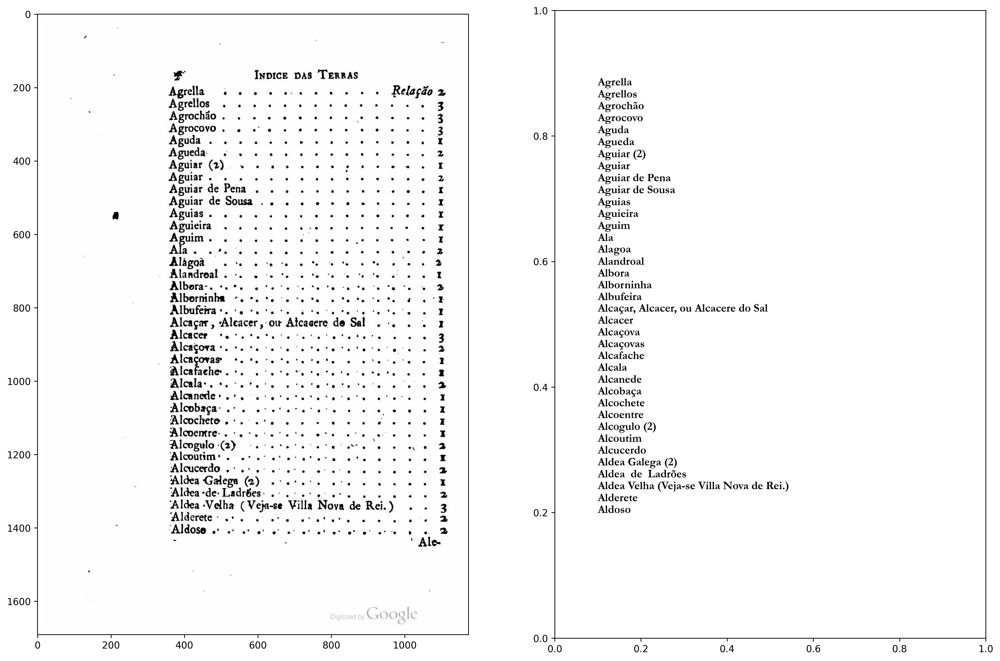

In [ ]:
text = ""

os.chdir(base_path + "indice/")

# grabbing the final text files which have been slightly altered manually
with open(f'final_indice_{random_idx - START + 1}.txt', 'r', encoding = 'utf-8') as f:
        lines = f.readlines()
        for line in lines:
            if (line != "\n"):
                text += line

# displaying the original image and the text from OCR side-by-side
random_pg = cv.imread(image_paths[random_idx])
plt.figure(figsize=(18, 12), dpi=300)
plt.subplot(121),plt.imshow(random_pg)
plt.subplot(122),plt.text(0.1, 0.2, text, fontsize = 12,
                          verticalalignment = 'baseline', fontfamily='Garamond', fontweight='black')
plt.show()

# Now that we have the final, cleaned lists of towns and cities in Portugal, we can use the World Historical Gazetteer API to search for matches and get information on their absolute location.

In [44]:
url = "https://whgazetteer.org/api/index/?"

places = {
    'name': [],
    'lat': [],
    'long': []
         }

for i in range(START, END+1):

  with open(f'final_indice_{i - START + 1}.txt', 'r', encoding = 'utf-8') as f:
          lines = f.readlines()
          for line in lines:
              if (line != "\n"):
                  line = line.strip()
                  # setting our search parameters for the name of the town/city
                  params = {
                      "name": line,
                      "name_startswith": line
                  }
                  # sending a GET request to the API with our paramete
                  response = requests.get(url, params=params)

                  # printing the response if we have at least one match

                  if (response.json()['count'] > 0):

                      # grabbing the name, latitude, and longitude from the JSON object

                      try:
                        name = response.json()['features'][0]['properties']['title']
                        coordinates = response.json()['features'][0]['geometry']['coordinates']
                        places['lat'].append(coordinates[1])
                        places['long'].append(coordinates[0])
                        places['name'].append(name)

                      except:
                        continue

print("Done grabbing API data!")

Done grabbing API data!


In [45]:
# Arranging our place names along with their coordinates in a DataFrame

df = pd.DataFrame(data = places)
df.head()

,name,lat,long
0,Abaças,41.226962,-7.698483
1,Abitureira,39.998870,-7.890400
2,Abiul,39.871160,-8.541671
3,Abrantes,39.466700,-8.200000
4,Abreiro,41.353667,-7.294818


In [48]:
# Plotting our locations on a map

fig = px.scatter_geo(df, lat='lat',lon='long', hover_name="name", fitbounds="locations", scope = "world")
fig.update_layout(title = 'Towns and Cities from the Index', title_x=0.5)

# We have successfully now mapped a large chunk of the cities/towns appropriately. There are still mismatches from the API data that need to be resolved but we accurately found a significant portion of the towns in Portugal, Brazil and other former colonies.